In [22]:
from typing import List
from collections import Counter

import pandas as pd
import numpy as np
from tqdm import tqdm
from IPython.display import clear_output
import matplotlib.pyplot as plt
import seaborn as sns
from pycaret.datasets import get_data
from pycaret.anomaly import (
    setup,
    models,
    create_model,
    assign_model
)
from sklearn.manifold import TSNE
from ydata_profiling import ProfileReport

plt.rcParams['font.sans-serif'] = 'DejaVu Sans' 

## Loading the dataset

In [2]:
data = get_data('anomaly')

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754


## Exploring the data

Generate a standard profiling report

In [4]:
profile = ProfileReport(data, title="Anomaly dataset profiling report")

Display the report as a notebook iframe.

In [5]:
%%time

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 45 s, sys: 13.8 s, total: 58.8 s
Wall time: 38.4 s


Overall, there no big issues with the dataset. Which was expected since it's a synthetict dataset created to demonstrate PyCaret's capabilities.

#### On the shape

- The provided dataset consists of 10 numerical variables (Col1 to Col10) with 1,000 observations each, totaling a size of 78.2 KiB in memory.

- If it was a real dataset, it would be impressive that the it doesn't contain any missing or infinite values, and no duplicate rows were found. I would say that we have excellent data integrity and quality.

#### The distributions

- No normal distribution, but Col5 to Col9 have two or multiple peaks (Multimodal distributions, visualy).
- The means for all variables lie relatively close to each other, hovering around 0.5, indicating that the distribution of the variables is more or less centered around this value (it can be a seed?).
- Histograms are good to have for this use case since we can define **bounderies** of the usual values of each column.

#### The values

- The values for all variables range from 0 to approximately 1, with the exception of Col10 that has a minimum of 0.014494632. 

- Each variable has exactly 1,000 distinct values, suggesting a broad spread of data without repetitive observations. This is an **unusual trait** for real-world datasets and indicates that each observation is distinct from all others for these variables.

- Also, each variable has a single zero value, but no negative values, which indicates that the measurements captured are strictly non-negative.

#### Interactions
- The dataset includes a unique high correlation between Col5 to Col10. This strong correlation could be significant in building predictive models or in feature selection processes.


#### Pairplot
Altough we have it in the Interactions section of the report, by selecting pairs of columns, I personally like to take a look at the pairplot of all variable (if we have a low number of dimensions).

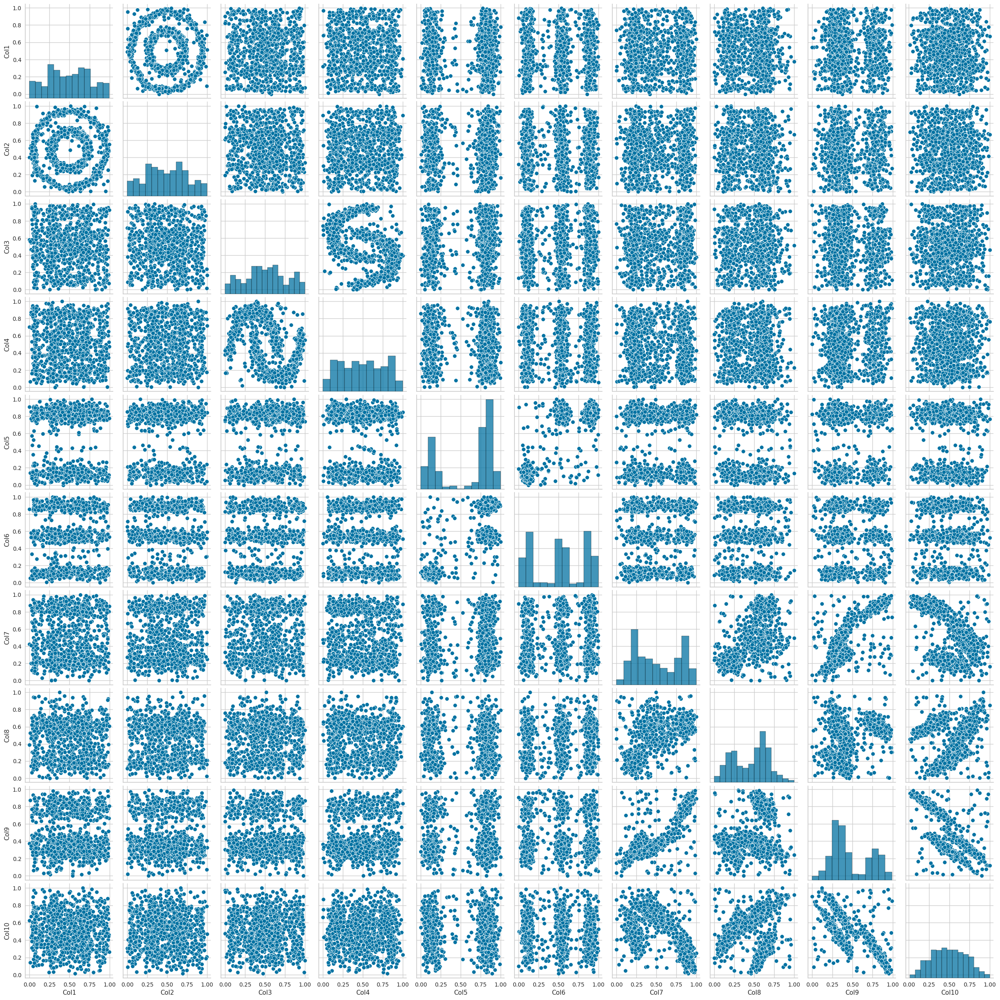

In [6]:
sns.pairplot(data)

It's always nice to see multiple types of correlations in one dataset. Less features to use, but not sure if it helps in an anomaly detection context.

## PyCaret setup

In [7]:
experiment = setup(
    data,
    session_id=42,
    experiment_name='Anomaly detection'
)

,Description,Value
0,Session id,42
1,Original data shape,"(1000, 10)"
2,Transformed data shape,"(1000, 10)"
3,Numeric features,10
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


### Exploring models

In [8]:
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


I'll just pick 3 models for an initial test.

In [9]:
histogram = create_model('histogram')
histogram_results = assign_model(histogram)
print(histogram_results[histogram_results['Anomaly'] == 1].shape)
histogram_results.head()

(50, 12)


,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.555819
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-5.614809
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,4.082791
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,0,1.464407
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,1,3.203719


In [10]:
iforest = create_model('iforest')
iforest_results = assign_model(iforest)
print(iforest_results[iforest_results['Anomaly'] == 1].shape)
iforest_results.head()

(50, 12)


,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.022060
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-0.073092
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,0,-0.000006
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.047849
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,-0.014288


In [11]:
lof = create_model('lof')
lof_results = assign_model(lof)
print(lof_results[lof_results['Anomaly'] == 1].shape)
lof_results.head()

(50, 12)


,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,1.262566
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,1.043429
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,0,1.331218
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,1.591832
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,1.223608


In [12]:
knn = create_model('knn')
knn_results = assign_model(knn)
print(knn_results[knn_results['Anomaly'] == 1].shape)
knn_results.head()

(50, 12)


,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,0.569672
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,0.484217
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.691915
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.811600
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,0.634337


The 4 models are detecting 50 (5%) data points as anomalies. However, those data points are not always the same.

## Ensemble modeling

There are several options to combine the results of multiple anomaly detection models to create a more robust detection system. Here are some strategies:

1. **Ensemble Methods**: This is a technique where you combine the results of multiple models to get a final result. There are several ways to do this:

- Majority Voting: An anomaly is flagged if the majority of the models flag it as an anomaly.

- Weighted Voting: Each model is assigned a weight based on its performance (accuracy, F1 score, etc.) on a validation set. An anomaly is flagged based on the weighted votes.

- Stacking: Train a meta-model that takes the output of all models as input and predicts whether an instance is an anomaly.

2. **Union of Anomalies**: Anomaly is flagged if at least one of the models flags it as an anomaly. This approach increases the chance of catching anomalies but also increases the false positive rate.

3. **Intersection of Anomalies**: Anomaly is flagged if all models agree that it is an anomaly. This approach decreases the false positive rate but might miss some anomalies.

4. **Rank Aggregation**: Each model ranks the instances by their anomaly score. The ranks are then combined (for example, by taking the average rank) to get a final rank for each instance. The top-ranked instances are flagged as anomalies.

5. **Bayesian Model Combination**: This is a more advanced technique where a Bayesian model is used to combine the outputs of the models.

Since the dataset is not labeled, I will use a Majority vote on all the available models.

Note that this is a brute force method and other strategies might be better to use if labeled data is available.

In [13]:
def majority_vote(predictions: List[List[int]]) -> List[int]:
    """
    Function to implement majority voting such as an anomaly is flagged if the majority of
    the models flag it as an anomaly.

    Parameters:
        predictions (List[List[int]]): A list of lists. Each inner list contains a model's predictions
        for the set of data points (instances).

    Returns:
        List[int]: A list of majority votes for each data point.
    """

    # Transpose the prediction list to group predictions for the same instance together
    transposed_predictions = list(zip(*predictions))
    
    # For each instance, count the votes for each class and take the class with the most votes
    majority_votes = [Counter(votes).most_common(1)[0][0] for votes in transposed_predictions]
    
    return majority_votes

In [14]:
models_predictions = []

for model_name in tqdm(models().index):
    # Create a model
    model = create_model(model_name)
    # Assign labels
    model_results = assign_model(model)
    # Append list with model's predictions
    models_predictions.append(model_results['Anomaly'])
    
    clear_output()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:17<00:00,  1.42s/it]


In [15]:
data['Anomaly'] = majority_vote(models_predictions)

In [16]:
data.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,0
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0


In [17]:
data['Anomaly'].describe()

count    1000.000000
mean        0.040000
std         0.196057
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Anomaly, dtype: float64

We can see that only 4% of data points are labeled as anomalies via the majority vote.

## Validating results 🧐

Usually, when we are in an unsupervised learning context, here are some steps that we can take:

1. **Anomaly Score**: You can assign an anomaly score to each instance based on the number of models that flagged it as an anomaly. For example, if you have 5 models and an instance is flagged by 3 of them, its anomaly score could be 3/5 = 0.6.

2. **Thresholding**: You can set a threshold on the anomaly score to decide which instances to flag as anomalies. The choice of threshold can be based on domain knowledge or on the distribution of the anomaly scores.

3. **Visual Inspection**: If the dimensionality of your data allows it (2D or 3D), you can plot your instances and color them based on their anomaly score. This might give you insights on which instances are anomalies.

4. **Domain Knowledge**: If you have domain knowledge, you might be able to manually inspect some of the instances with high anomaly scores and decide whether they are true anomalies.

5. **Feedback Loop**: If possible, you can set up a feedback loop where a domain expert reviews and labels some of the instances flagged as anomalies. These labels can then be used to improve your models.

But since this is a synthetic dataset, we cannot use domain knowledge method. However, we can still:

### Anomaly score

In [18]:
def calculate_anomaly_scores(predictions: List[List[int]]) -> List[float]:
    """
    Function to calculate anomaly scores.

    Parameters:
        predictions (List[List[int]]): A list of lists. Each inner list contains model
        predictions for a set of instances.

    Returns:
        List[float]: A list of anomaly scores for each datapoint.
    """

    # Transpose the prediction list to group predictions for the same instance together
    transposed_predictions = list(zip(*predictions))
    
    # For each instance, calculate the anomaly score as the proportion of models that flagged it as an anomaly
    anomaly_scores = [sum(votes) / len(votes) for votes in transposed_predictions]
    
    return anomaly_scores

In [19]:
data['Anomaly score'] = calculate_anomaly_scores(models_predictions)

In [20]:
data[data['Anomaly'] == 1].describe()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly score
count,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.0,40.000000
mean,0.496193,0.448977,0.447005,0.546840,0.414666,0.555555,0.473616,0.494642,0.510576,0.572796,1.0,0.756250
std,0.308842,0.302709,0.309062,0.314684,0.317137,0.272846,0.318917,0.333770,0.366546,0.317500,0.0,0.157196
min,0.052790,0.005154,0.003605,0.065955,0.014315,0.005931,0.001797,0.004269,0.019866,0.028729,1.0,0.500000
25%,0.210182,0.217420,0.184135,0.215898,0.117403,0.315228,0.243080,0.200656,0.121432,0.299165,1.0,0.583333
50%,0.470620,0.452561,0.396977,0.558276,0.369309,0.627146,0.463180,0.501549,0.544825,0.572652,1.0,0.750000
75%,0.797926,0.679247,0.703985,0.847491,0.657727,0.756081,0.723451,0.824359,0.894116,0.861457,1.0,0.916667
max,0.981709,0.995017,0.993018,0.971078,0.959889,0.973765,0.986392,0.952670,0.988732,0.985357,1.0,1.000000


- The mean anomaly score is around 0.756, suggesting that on average, about 75.6% of the models are flagging an instance as an anomaly.
- The minimum score is 0.5, which is consistent with the majority voting approach (an instance is labeled as an anomaly if at least half of the models flag it as such).
- The maximum score is 1, meaning that there are some instances that all models agree on being anomalies.

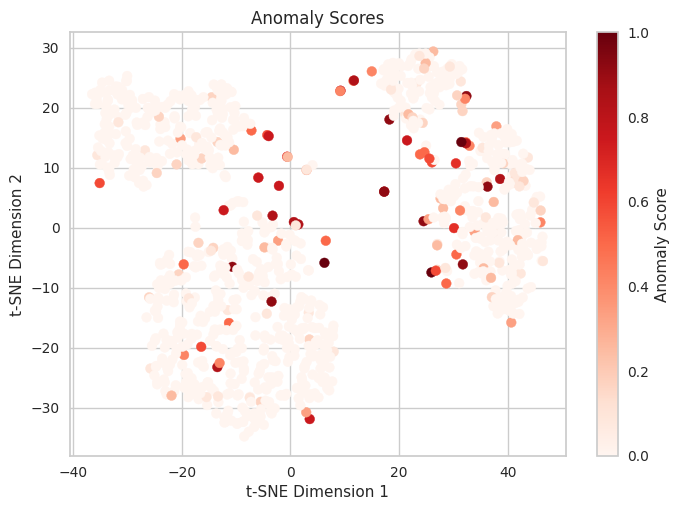

In [23]:
def plot_anomalies(data: pd.DataFrame, anomaly_scores: List[float]) -> None:
    """
    Function to plot instances colored by their anomaly scores.

    Parameters:
        data (DataFrame): A pandas DataFrame containing the data point.
            Each row is an data point, and each column is a feature.
        anomaly_scores (List[float]): A list of anomaly scores.
            The anomaly score of the data point at index i is anomaly_scores[i].
    """
    # Use t-SNE for dimensionality reduction
    tsne = TSNE(n_components=2)
    data_2d = tsne.fit_transform(data)

    plt.scatter(data_2d[:, 0], data_2d[:, 1], c=anomaly_scores, cmap='Reds')
    plt.colorbar(label='Anomaly Score')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.title('Anomaly Scores')
    plt.show()

plot_anomalies(data.drop(['Anomaly', 'Anomaly score'], axis=1), data['Anomaly score'])

The scatter plot generated by t-SNE provides a visual representation of the instances in the dataset. With each point corresponding to a data point, the color of each point represents its anomaly score, with darker colors indicating higher scores.

It seems that the anomaly scores are providing a good indication of the anomalies in the dataset.

**Spread of Anomalies**: The points with high anomaly scores are spread throughout the plot, this could indicate that the models are identifying a wide variety of anomalies. This can only be validated if we had labeled data points or if the column names were shared.

## Conclusion

This notebook demonstrates the application of PyCaret for anomaly detection on a synthetic dataset.

- By combining the predictions of different models through majority voting, anomalies were effectively identified.

- The ensemble approach achieved an anomaly detection rate of approximately 4%.

- Anomaly scores and visual inspection techniques were employed to validate the results.

Overall, this walkthrough provides a practical framework for implementing anomaly detection models.

## Potential Next Steps
*Using this dataset or a real world one.*

- **Fine-tune Models**: Experiment with different anomaly detection models and their hyperparameters to improve detection performance. Evaluate the impact of model selection on the overall anomaly detection rate.

- **Incorporate Labeled Data**: If available, include labeled data to evaluate and fine-tune the performance of the anomaly detection models. Use labeled data to calculate metrics such as precision, recall, and F1-score to assess the models' accuracy.

- **Expand Feature Set**: Explore the possibility of adding more features or incorporating additional datasets to enhance the anomaly detection process. Consider feature engineering techniques to derive more informative features for better anomaly detection.

- **Real-World Application**: Apply the anomaly detection system developed in this walkthrough to real-world datasets and evaluate its performance in different domains. Consider deploying the system in a production environment to monitor and detect anomalies in real-time.